# Red Wine Quality Prediction

### Models/Algorithms to be used
- Neural Networks
- Support Vector Machine
- K-Nearest Neighbors
- Boosting with Decision Trees

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from ydata_profiling import ProfileReport


from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split,cross_val_score,StratifiedKFold,GridSearchCV,validation_curve,learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,confusion_matrix

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss,CondensedNearestNeighbour

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [4]:
gtid = 903971235



## Load and Analyze Data

In [5]:
df = pd.read_csv("/Users/nasharma/GATECH ML/A1/data/wine_quality/winequality-red.csv",delimiter=';')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [7]:
profile = ProfileReport(df, title="Red-Wine-Profiling-Report")


In [8]:
profile.to_file("Red-Wine-Profiling-Report")
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/ydata_profiling/profile_report.py:384: UserWarning: Extension  not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

##### Quick Notes

1. Looks like dataset has no null values.
2. All Features are Real Number features (continuous) barring Quality which in Whole Numbers between 3-8
3. Quality needs to be converted to a binary classification target


In [9]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

## Further exploration


In [10]:
# Checking the data types
df.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

## Visual Data Exploration 


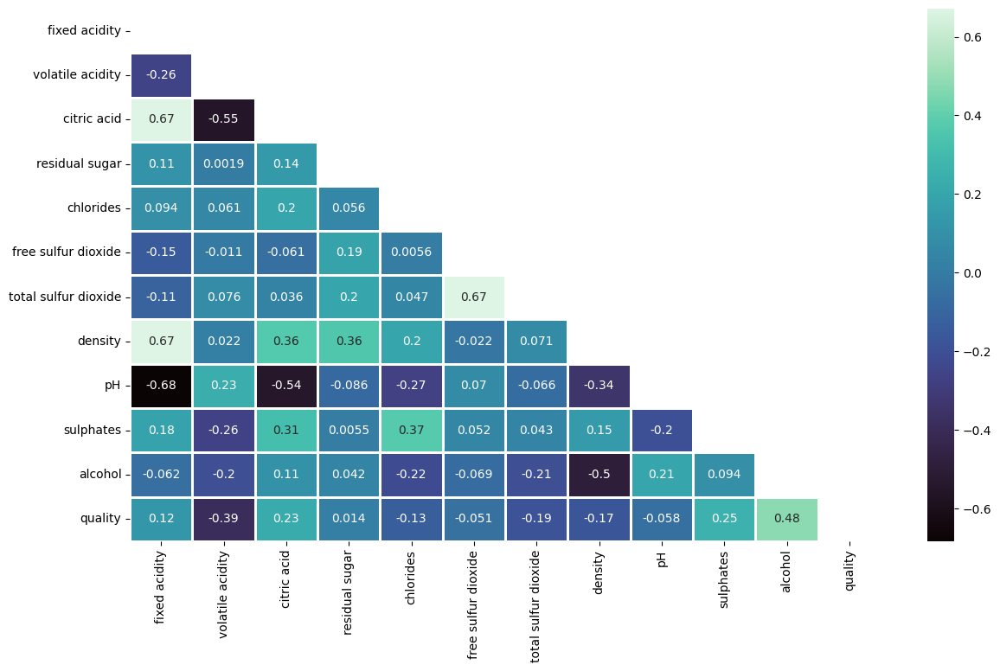

In [11]:
# Correlation across features

plt.figure(figsize = (14, 8))

corr_matrix = df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype = bool))

sns.heatmap(corr_matrix, cmap='mako', mask = mask, annot = True, fmt = '0.2g', linewidths = 1)
plt.show()

## Feature Scaling and Transformations, Train-Test-Split, Class Imbalance Handling

In [12]:
# converting this to a binary classification problem, quality above or equal to 6 is 1, where anything less than that is 0
df['quality'] = (df['quality'] >= 6).astype(int)

X = df.drop('quality', axis = 1)
y = df['quality']

In [13]:
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [14]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

In [25]:
X_train

array([[ 0.16107692, -1.71963208,  0.45714436, ...,  1.02947179,
         1.25019886,  0.54162988],
       [ 2.40174566, -0.37887771,  1.84360683, ..., -2.0805817 ,
         1.25019886, -0.20930812],
       [-0.6432657 ,  0.06804042, -0.0050098 , ...,  0.51112954,
         0.30598963,  0.54162988],
       ...,
       [-0.6432657 ,  0.51495855, -1.08336951, ...,  1.28864292,
        -0.69723268, -0.86637886],
       [-0.24109439, -1.83136161,  0.4057939 , ...,  0.05758008,
         0.83710732,  1.38643512],
       [-1.44760832, -1.32857872, -0.05636026, ...,  0.51112954,
        -0.69723268,  2.8883111 ]])

## Modelling

#### Helper Functions

In [30]:
def evaluate_model_with_cv(estimator, X_train, y_train, cv=5):
    kf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)

    # Lists to store metrics for each fold
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    roc_auc_scores = []

    # Iterate through each fold
    for train_index, val_index in kf.split(X_train, y_train):
        X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]
        
        # Fit the model
        estimator.fit(X_train_fold, y_train_fold)
        
        # Make predictions
        y_val_pred = estimator.predict(X_val_fold)
        if hasattr(estimator, "predict_proba"):
            y_val_pred_proba = estimator.predict_proba(X_val_fold)[:, 1]
        else:
            y_val_pred_proba = None
        
        # Calculate metrics
        accuracy_scores.append(accuracy_score(y_val_fold, y_val_pred))
        precision_scores.append(precision_score(y_val_fold, y_val_pred, average='weighted'))
        recall_scores.append(recall_score(y_val_fold, y_val_pred, average='weighted'))
        f1_scores.append(f1_score(y_val_fold, y_val_pred, average='weighted'))
        if y_val_pred_proba is not None:
            roc_auc_scores.append(roc_auc_score(y_val_fold, y_val_pred_proba))

    # Convert lists to numpy arrays for easy calculation of mean and standard deviation
    accuracy_scores = np.array(accuracy_scores)
    precision_scores = np.array(precision_scores)
    recall_scores = np.array(recall_scores)
    f1_scores = np.array(f1_scores)
    roc_auc_scores = np.array(roc_auc_scores) if roc_auc_scores else None

    # Print the metrics
    print(f"Accuracy: {accuracy_scores.mean():.4f} ± {accuracy_scores.std():.4f}")
    print(f"Precision: {precision_scores.mean():.4f} ± {precision_scores.std():.4f}")
    print(f"Recall: {recall_scores.mean():.4f} ± {recall_scores.std():.4f}")
    print(f"F1 Score: {f1_scores.mean():.4f} ± {f1_scores.std():.4f}")
    if roc_auc_scores is not None:
        print(f"ROC AUC Score: {roc_auc_scores.mean():.4f} ± {roc_auc_scores.std():.4f}")

    # Return the metrics in a dictionary
    return {
        'accuracy': (accuracy_scores.mean(), accuracy_scores.std()),
        'precision': (precision_scores.mean(), precision_scores.std()),
        'recall': (recall_scores.mean(), recall_scores.std()),
        'f1': (f1_scores.mean(), f1_scores.std()),
        'roc_auc': (roc_auc_scores.mean(), roc_auc_scores.std()) if roc_auc_scores is not None else None
    }




In [31]:
#Accuracy, Precision, Recall, F1 and ROC AUC and Confusion Matrix


def evaluate_model_performace(model,X_test,y_test):

    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"ROC AUC Score: {roc_auc:.4f}")


    # Compute the confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot the confusion matrix
    plt.figure(figsize=(5, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=['Not Churn', 'Churn'], yticklabels=['Not Churn', 'Churn'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    return {
        'accuracy': round(accuracy,3),
        'precision': round(precision,3),
        'recall': round(recall,3),
        'f1': round(f1,3),
        'roc_auc': round(roc_auc,3),
    }


In [32]:
def plot_validation_curve(estimator, X, y, param_name, param_range, param_is_tuple=False, cv=5, scoring='accuracy', n_jobs=-1):

    if param_is_tuple:
        train_scores, test_scores = [], []
        train_scores_std, test_scores_std = [], []
        for param in param_range:
            train_score, test_score = validation_curve(
                estimator, X, y,
                param_name=param_name,
                param_range=[param],  # Pass param as a single-element list
                cv=cv,
                scoring=scoring,
                n_jobs=n_jobs
            )
            train_scores.append(train_score.mean())
            train_scores_std.append(train_score.std())
            test_scores.append(test_score.mean())
            test_scores_std.append(test_score.std())
        train_scores = np.array(train_scores)
        test_scores = np.array(test_scores)
        train_scores_std = np.array(train_scores_std)
        test_scores_std = np.array(test_scores_std)
    else:
        train_scores, test_scores = validation_curve(
            estimator, X, y, 
            param_name=param_name, 
            param_range=param_range, 
            cv=cv, 
            scoring=scoring, 
            n_jobs=n_jobs
        )
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

    # Plot validation curve
    plt.figure(figsize=(10, 6))
    plt.title(f"Validation Curve for {param_name}")
    plt.xlabel(param_name)
    plt.ylabel("Score")
    plt.ylim(0.7, 1.0)
    lw = 2

    if param_is_tuple:
        param_range_str = [str(param) for param in param_range]
        plt.plot(param_range_str, train_scores, label="Training score", color="darkorange", lw=lw)
        plt.fill_between(param_range_str, train_scores - train_scores_std, train_scores + train_scores_std, alpha=0.2, color="darkorange", lw=lw)
        plt.plot(param_range_str, test_scores, label="Cross-validation score", color="navy", lw=lw)
        plt.fill_between(param_range_str, test_scores - test_scores_std, test_scores + test_scores_std, alpha=0.2, color="navy", lw=lw)
    else:
        plt.plot(param_range, train_scores_mean, label="Training score", color="darkorange", lw=lw)
        plt.fill_between(param_range, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color="darkorange", lw=lw)
        plt.plot(param_range, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
        plt.fill_between(param_range, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color="navy", lw=lw)

    plt.legend(loc="best")
    plt.show()



In [33]:
def plot_learning_curve(estimator, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'):
    # Generate the learning curve
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        scoring=scoring
    )

    # Calculate mean and standard deviation
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Print train sizes
    print("Training sizes used:", train_sizes)

    # Plot learning curves
    plt.figure(figsize=(8, 6))
    plt.title(f"Learning Curves with {type(estimator).__name__}")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.ylim(0.7, 1)
    lw = 2

    # Plot training scores
    plt.plot(train_sizes, train_scores_mean, label="Training score", color="darkorange", lw=lw)
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color="darkorange", lw=lw)

    # Plot cross-validation scores
    plt.plot(train_sizes, test_scores_mean, label="Cross-validation score", color="navy", lw=lw)
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color="navy", lw=lw)

    plt.legend(loc="best")
    plt.show()

### 1. Neural Networks: Multi Layered Perceptron 


In [38]:
X_train = np.array(X_train)
y_train = np.array(y_train)

In [36]:

model_mlp = MLPClassifier(solver='adam',
                alpha=1e-5, 
                hidden_layer_sizes=(32),
                random_state=1,
                max_iter=1000
                )

In [39]:
metrics = evaluate_model_with_cv(model_mlp, X_train, y_train)
print(metrics)

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Accuracy: 0.7506 ± 0.0333
Precision: 0.7534 ± 0.0319
Recall: 0.7506 ± 0.0333
F1 Score: 0.7502 ± 0.0336
ROC AUC Score: 0.8201 ± 0.0346
{'accuracy': (0.7506486226777707, 0.03327044404510457), 'precision': (0.7533713115909105, 0.031860255482672), 'recall': (0.7506486226777707, 0.03327044404510457), 'f1': (0.7501628908061555, 0.03357512350678267), 'roc_auc': (0.820065488944173, 0.034619449213441636)}


/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


##### Training base model on entire data w learning curve

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


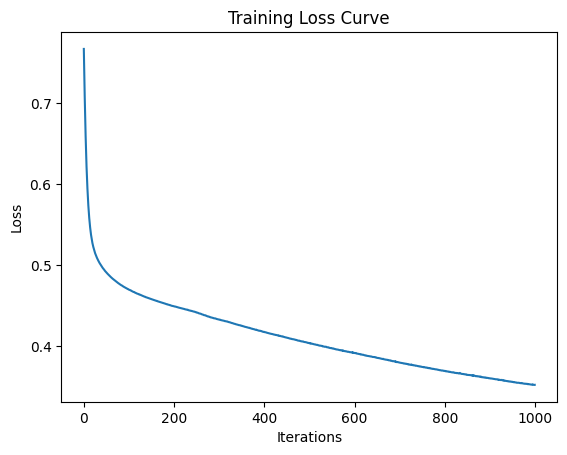

In [41]:
model_mlp.fit(X_train, y_train)
plt.plot(model_mlp.loss_curve_)
plt.title('Training Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()


#### Evaluation of Base Model

Accuracy: 0.7812
Precision: 0.8022
Recall: 0.8052
F1 Score: 0.8037
ROC AUC Score: 0.8485


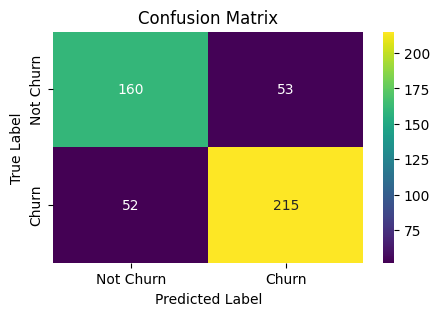

In [42]:
model_performance_on_test = evaluate_model_performace(model_mlp,X_test,y_test)

#### Grid Search for Hyperparameter Tuning

In [43]:
param_grid = {
    'hidden_layer_sizes': [(16,), (32,), (64,), (32, 16), (64, 32),(64,32,16)],
    'alpha': [1e-6, 1e-5, 1e-4, 1e-3, 1e-2],
    'learning_rate_init': [0.0001,0.001, 0.01, 0.1]
}

In [ ]:
base_model_mlp = MLPClassifier(solver='adam', random_state=1, max_iter=1000)


grid_search = GridSearchCV(estimator=base_model_mlp, param_grid=param_grid, 
                           scoring='accuracy', cv=5, n_jobs=-1, verbose=2)

grid_search.fit(X_train, y_train)

In [45]:
# Get the best parameters
best_params = grid_search.best_params_
print("Best parameters found: ", best_params)

Best parameters found:  {'alpha': 0.0001, 'hidden_layer_sizes': (64, 32, 16), 'learning_rate_init': 0.0001}


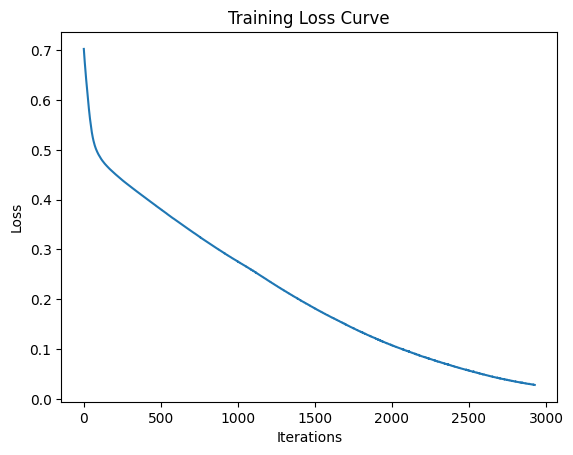

In [47]:
# Train the final model with the best parameters
model_mlp_best = MLPClassifier(solver='adam', 
                               alpha=best_params['alpha'], 
                               hidden_layer_sizes=best_params['hidden_layer_sizes'], 
                               learning_rate_init=best_params['learning_rate_init'],
                               random_state=1, 
                               max_iter=5000)

model_mlp_best.fit(X_train, y_train)

# Plot the training loss curve
plt.plot(model_mlp_best.loss_curve_)
plt.title('Training Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()


Accuracy: 0.7438
Precision: 0.7667
Recall: 0.7753
F1 Score: 0.7709
ROC AUC Score: 0.8029


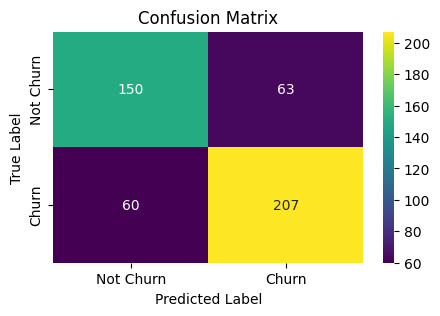

In [48]:
results = evaluate_model_performace(model_mlp_best,X_test,y_test)


####  Plotting Validation Curves for Each of the Three Hyperparams

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


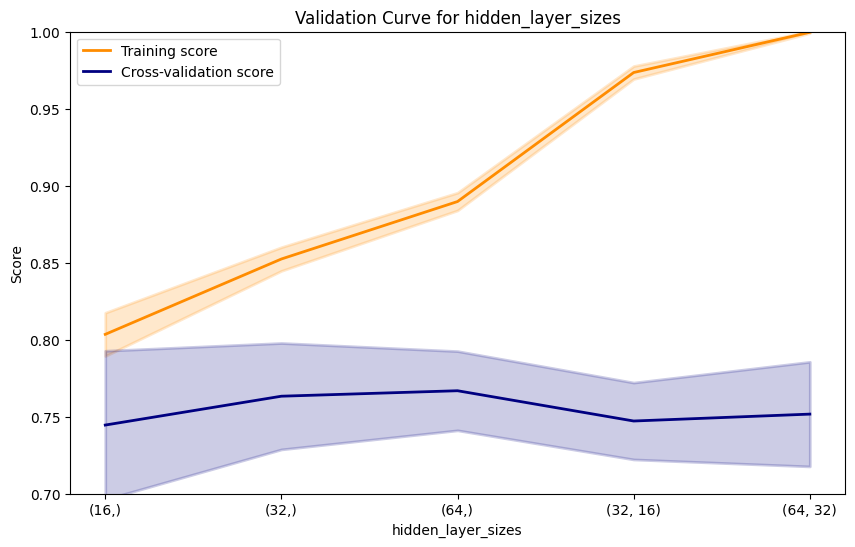

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


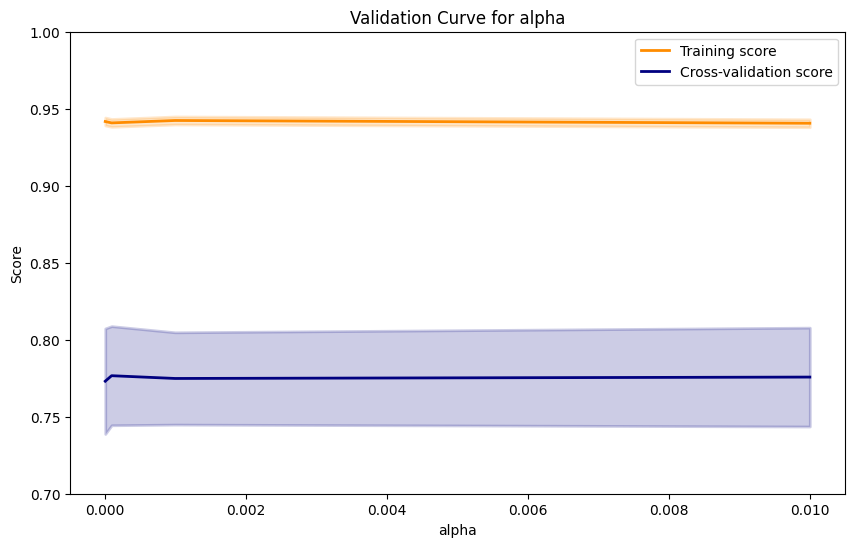

/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/nasharma/GATECH ML/.venv/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


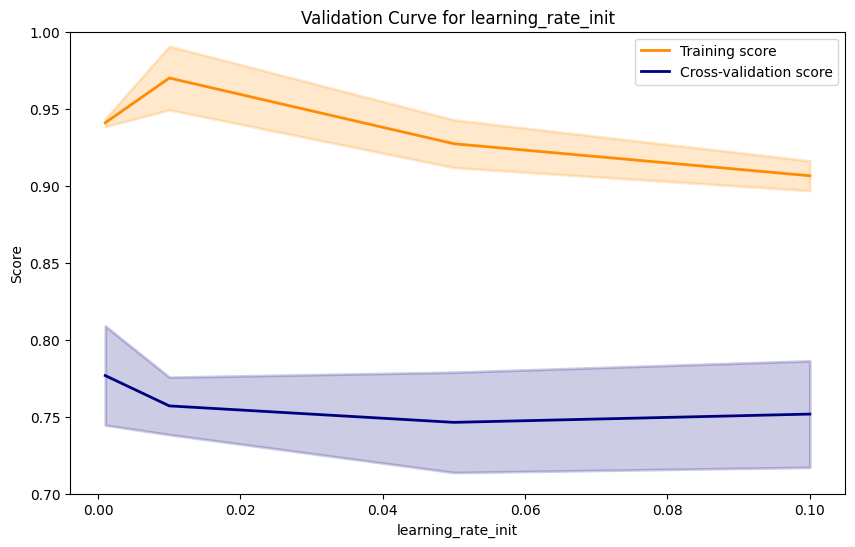

In [50]:

# Define the parameter ranges
hidden_layer_sizes_range = [(16,), (32,), (64,), (32, 16), (64, 32)]
alpha_range = [1e-5, 1e-4, 1e-3, 1e-2]
learning_rate_init_range = [0.001, 0.01, 0.05, 0.1]

# Initialize the MLPClassifier with base parameters
base_model = MLPClassifier(solver='adam', random_state=1, max_iter=1000)

# Plot validation curves for each parameter
plot_validation_curve(base_model, X_train, y_train, 'hidden_layer_sizes', hidden_layer_sizes_range, param_is_tuple=True)
plot_validation_curve(base_model, X_train, y_train, 'alpha', alpha_range)
plot_validation_curve(base_model, X_train, y_train, 'learning_rate_init', learning_rate_init_range)


#### Learning Curve

Training sizes used: [ 89 179 268 358 447 537 626 716 805 895]


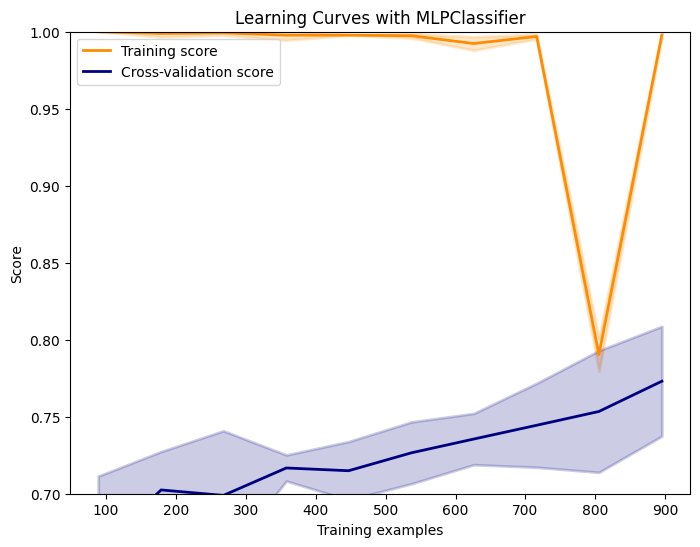

In [53]:
plot_learning_curve(model_mlp_best, X_train, y_train)


### Support Vector Machines

##### Initialize a base SVM and test with 5FoldCV

In [54]:
model_svm = SVC(probability=True)
training_results = evaluate_model_with_cv(model_svm,X_train,y_train)


Accuracy: 0.7748 ± 0.0256
Precision: 0.7784 ± 0.0272
Recall: 0.7748 ± 0.0256
F1 Score: 0.7745 ± 0.0256
ROC AUC Score: 0.8388 ± 0.0333


##### Traning on Full Data

In [55]:
model_svm.fit(X_train,y_train)


SVC(probability=True)


#### Evaluation of Base Model

Accuracy: 0.7479
Precision: 0.7967
Recall: 0.7341
F1 Score: 0.7641
ROC AUC Score: 0.8273


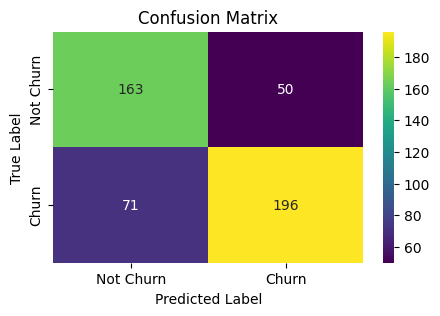

In [57]:
model_performance_on_test = evaluate_model_performace(model_svm,X_test,y_test)

#### Grid Search for Hyperparameter Tuning

In [58]:
param_grid = {
    'C': [0.1, 0.05,1, 10],
    'gamma': [1,0.1, 0.01, 0.001],
    'kernel': ['linear', 'rbf']
}

grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print("Best parameters found:", best_params)

Best parameters found: {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}


In [60]:
# Train the final model with the best parameters
model_svm_best = SVC(C=1,gamma=0.1,kernel='rbf',probability=True)
                        
model_svm_best.fit(X_train, y_train)




SVC(C=1, gamma=0.1, probability=True)

##### Evaluation of Final Model: Performance Metrics

Accuracy: 0.7562
Precision: 0.8049
Recall: 0.7416
F1 Score: 0.7719
ROC AUC Score: 0.8289


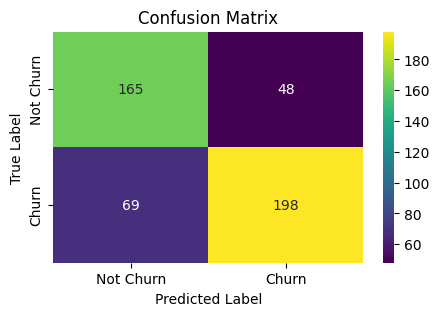

In [70]:

metrics = evaluate_model_performace(model_svm_best, X_test,y_test)


####  Plotting Validation Curves for Gamma and C

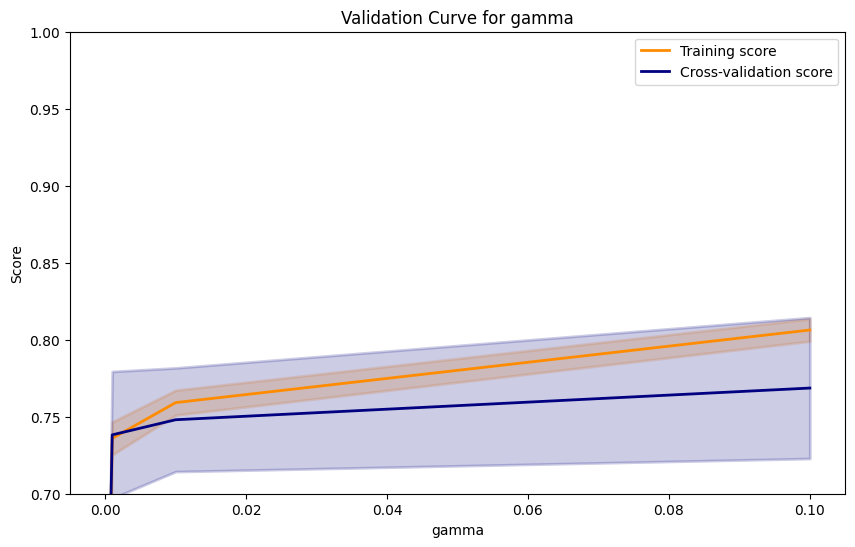

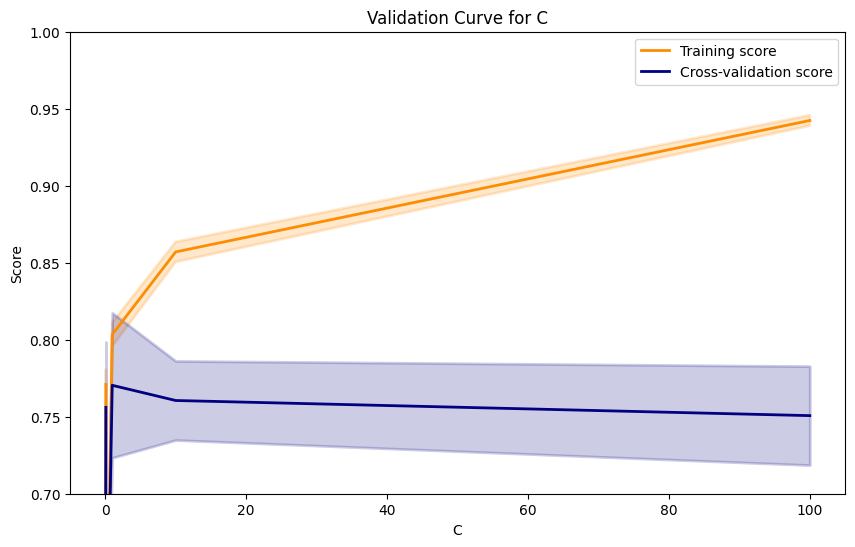

In [62]:
gamma_range = [1e-1,1e-2, 1e-3, 1e-4, 1e-5]
C_range = [0.1,0.01,1,10,100]

# Initialize the MLPClassifier with base parameters
base_model = SVC()

# Plot validation curves for each parameter
plot_validation_curve(base_model, X_train, y_train, 'gamma', gamma_range)
plot_validation_curve(base_model, X_train, y_train, 'C', C_range)

#### Learning Curve

Training sizes used: [ 89 179 268 358 447 537 626 716 805 895]


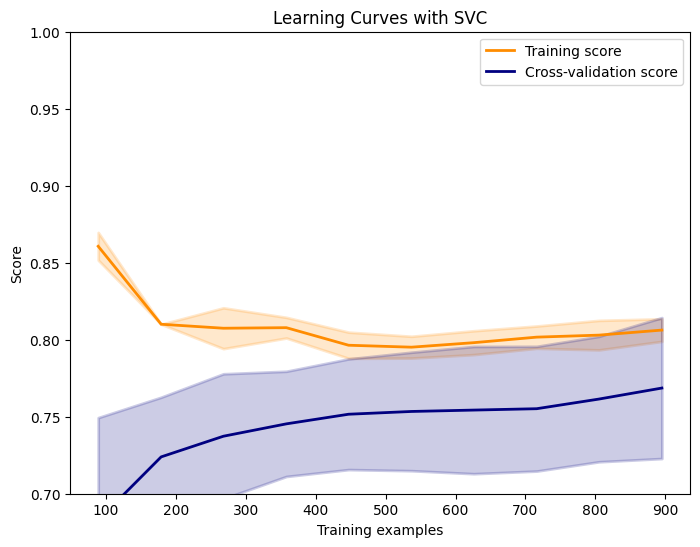

In [63]:

plot_learning_curve(model_svm_best, X_train, y_train)

#### 3. K-Nearest Neighbors

In [64]:
# Initialize the Base KNN classifier and do 5FoldCV
model_knn = KNeighborsClassifier()
knn_metrics = evaluate_model_with_cv(model_knn, X_train, y_train)


Accuracy: 0.7211 ± 0.0368
Precision: 0.7215 ± 0.0366
Recall: 0.7211 ± 0.0368
F1 Score: 0.7205 ± 0.0368
ROC AUC Score: 0.7870 ± 0.0445


##### Train Base Model on Full Data

Accuracy: 0.7479
Precision: 0.7967
Recall: 0.7341
F1 Score: 0.7641
ROC AUC Score: 0.8273


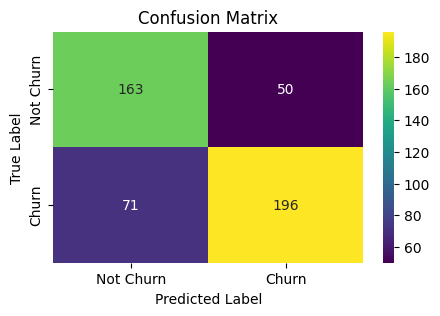

In [65]:
model_performance_on_test = evaluate_model_performace(model_svm,X_test,y_test)

#### Grid Search for Hyperparam Tuning

In [66]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15,20],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

In [67]:
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_knn_params = grid_search.best_params_
print("Best parameters found:", best_knn_params)

model_knn_best = grid_search.best_estimator_

Best parameters found: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}


##### Evaluation of Final Model: Performance Metrics


Accuracy: 0.7625
Precision: 0.7647
Recall: 0.8277
F1 Score: 0.7950
ROC AUC Score: 0.8610


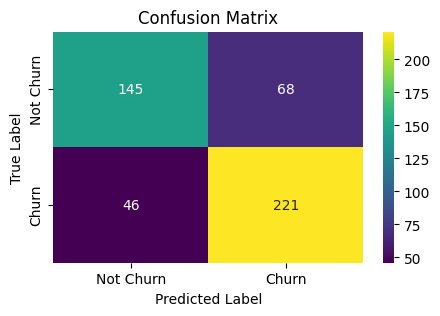

In [71]:
metrics = evaluate_model_performace(model_knn_best, X_test,y_test)


####  Plotting Validation Curves for n_neighbors and p (which defines power for minkowski metric)

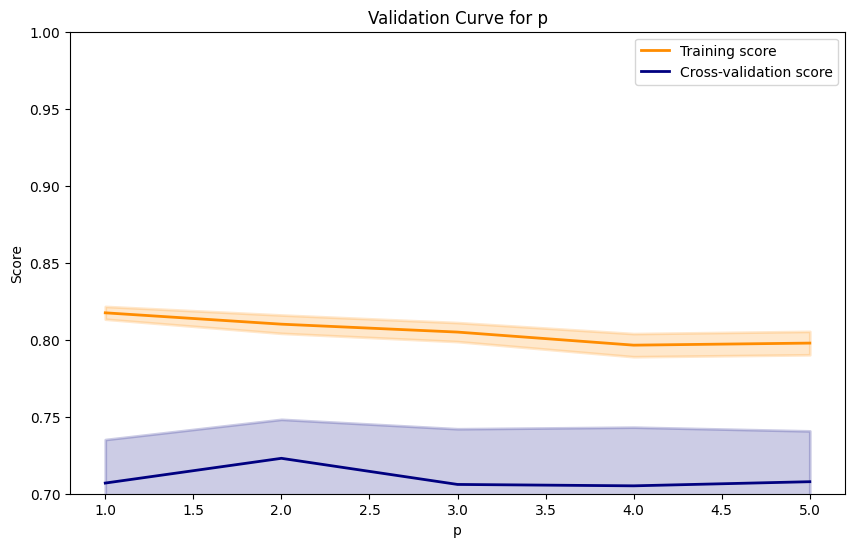

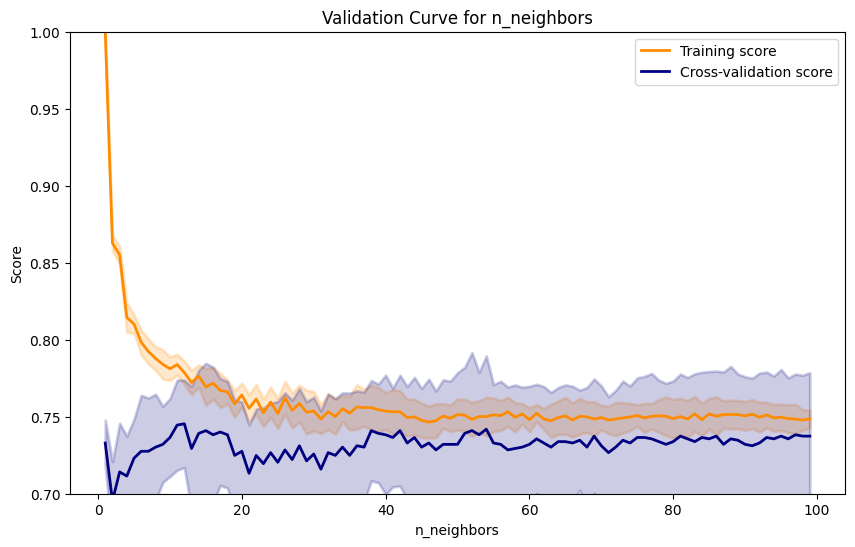

In [76]:
param_range_p = [1, 2, 3, 4, 5]
n_neighbors_range = np.arange(1,100)

model_knn_base = KNeighborsClassifier()
# Generate validation curve for 'p' parameter
plot_validation_curve(model_knn_base, X_train, y_train, param_name='p', param_range=param_range_p)
# Generate validation curve for 'n_neighbors'
plot_validation_curve(model_knn_base, X_train, y_train, param_name='n_neighbors', param_range=n_neighbors_range)


#### Learning Curve

Training sizes used: [ 89 179 268 358 447 537 626 716 805 895]


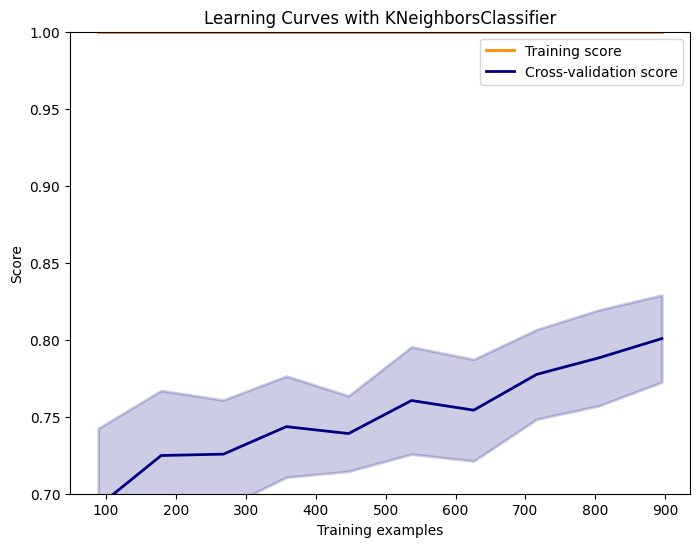

In [73]:
plot_learning_curve(model_knn_best, X_train, y_train)
